# Computer Vision : Deep Dream

## Importing the libraries

- Adapted from: https://www.tensorflow.org/beta/tutorials/generative/deepdream

In [2]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
tf.__version__

'2.18.0'

## Loading the pre-built convolutional neural network

- InceptionNet: https://www.tensorflow.org/api_docs/python/tf/keras/applications/inception_v3
- Original paper: https://www.cv-foundation.org/openaccess/content_cvpr_2016/papers/Szegedy_Rethinking_the_Inception_CVPR_2016_paper.pdf
- Imagenet: http://www.image-net.org/

In [3]:
base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


In [4]:
base_model.summary()

Model: "inception_v3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, None,      │        864 │ input_layer[0][0] │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, None,      │         96 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, None,      │      9,216 │ activation[0][0]  │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │         96 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, None,      │     18,432 │ activation_1[0][… │
│                     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        192 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, None,      │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, None,      │      5,120 │ max_pooling2d[0]… │
│                     │ None, 80)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        240 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ None, 80)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, None,      │          0 │ batch_normalizat… │
│ (Activation)        │ None, 80)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, None,      │    138,240 │ activation_3[0][… │
│                     │ None, 192)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, None,      │        576 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ None, 192)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, None,      │          0 │ batch_normalizat

 Total params: 21,802,784 (83.17 MB)

 Trainable params: 21,768,352 (83.04 MB)

 Non-trainable params: 34,432 (134.50 KB)

In [5]:
len(base_model.layers)

311

In [6]:
# Relu
#names = ['mixed3', 'mixed5', 'mixed8', 'mixed9']
names = ['mixed3', 'mixed5']

In [7]:
base_model.input

<KerasTensor shape=(None, None, None, 3), dtype=float32, sparse=False, name=keras_tensor>

In [8]:
layers = [base_model.get_layer(name).output for name in names]

In [9]:
layers

[<KerasTensor shape=(None, None, None, 768), dtype=float32, sparse=False, name=keras_tensor_100>,
 <KerasTensor shape=(None, None, None, 768), dtype=float32, sparse=False, name=keras_tensor_164>]

In [10]:
deep_dream_model = tf.keras.Model(inputs = base_model.input, outputs = layers)

## Loading and pre-processing the image

In [11]:
#from google.colab import drive
#drive.mount('/content/drive')

In [13]:
#image = tf.keras.preprocessing.image.load_img('/content/drive/MyDrive/vision/images/StaryNight.jpg',
#                                              target_size=(225, 375))

image = tf.keras.preprocessing.image.load_img('StaryNight.jpg', target_size=(225, 375))

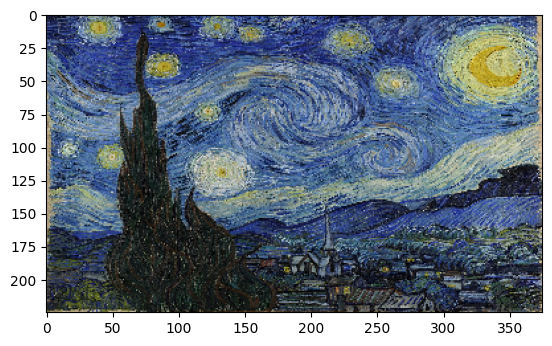

In [14]:
plt.imshow(image)

In [15]:
type(image)

PIL.Image.Image

In [16]:
image.size

(375, 225)

In [17]:
image.mode, len(image.mode)

('RGB', 3)

In [19]:
list(image.getdata())

[(6, 10, 11),
 (30, 33, 66),
 (35, 46, 66),
 (39, 46, 65),
 (46, 49, 68),
 (23, 27, 39),
 (13, 15, 38),
 (57, 61, 86),
 (85, 88, 97),
 (147, 147, 139),
 (138, 139, 123),
 (112, 116, 117),
 (18, 21, 52),
 (23, 28, 60),
 (85, 96, 116),
 (83, 92, 121),
 (148, 152, 155),
 (29, 32, 63),
 (57, 63, 99),
 (12, 20, 39),
 (34, 39, 69),
 (23, 30, 56),
 (4, 12, 48),
 (25, 32, 74),
 (48, 50, 98),
 (134, 133, 173),
 (127, 132, 152),
 (126, 133, 161),
 (138, 151, 168),
 (64, 76, 126),
 (67, 83, 119),
 (61, 75, 112),
 (73, 90, 134),
 (86, 118, 143),
 (55, 81, 80),
 (136, 155, 135),
 (51, 65, 74),
 (152, 169, 195),
 (156, 176, 211),
 (56, 79, 129),
 (94, 116, 165),
 (70, 94, 120),
 (160, 173, 189),
 (142, 156, 185),
 (92, 118, 135),
 (50, 74, 118),
 (107, 132, 162),
 (101, 122, 153),
 (27, 36, 67),
 (34, 44, 79),
 (97, 114, 140),
 (21, 41, 66),
 (51, 60, 101),
 (50, 56, 104),
 (34, 39, 68),
 (22, 24, 45),
 (3, 3, 29),
 (4, 7, 22),
 (28, 37, 34),
 (19, 27, 29),
 (19, 25, 41),
 (43, 49, 75),
 (93, 104, 1

In [20]:
image = tf.keras.preprocessing.image.img_to_array(image)

In [21]:
type(image)

numpy.ndarray

In [22]:
image.min(), image.max()

(0.0, 255.0)

In [23]:
image = tf.keras.applications.inception_v3.preprocess_input(image)

In [24]:
image.min(), image.max()

(-1.0, 1.0)

## Getting the activations

In [26]:
image.shape

(225, 375, 3)

In [27]:
image_batch = tf.expand_dims(image, axis = 0)

In [28]:
image_batch.shape

TensorShape([1, 225, 375, 3])

In [30]:
activations = deep_dream_model.predict(image_batch)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 755ms/step


In [31]:
deep_dream_model.outputs

[<KerasTensor shape=(None, None, None, 768), dtype=float32, sparse=False, name=keras_tensor_100>,
 <KerasTensor shape=(None, None, None, 768), dtype=float32, sparse=False, name=keras_tensor_164>]

## Calculating the loss

In [32]:
def calculate_loss(image, network):
    image_batch = tf.expand_dims(image, axis = 0)
    activations = network(image_batch)

    losses = []
    for act in activations:
        loss = tf.math.reduce_mean(act)
        losses.append(loss)

    print(losses)
    print(np.shape(losses))
    print(tf.reduce_sum(losses))

In [34]:
def calculate_loss(image, network):
    image_batch = tf.expand_dims(image, axis = 0)
    activations = network(image_batch)

    losses = []
    for act in activations:
        loss = tf.math.reduce_mean(act)
        losses.append(loss)

    return tf.reduce_sum(losses)

In [35]:
loss = calculate_loss(image, deep_dream_model)
loss

<tf.Tensor: shape=(), dtype=float32, numpy=0.6180766224861145>

## Gradient ascent

In [36]:
# Compare the activations with the pixels
# Emphasize parts of the image
# Change the pixels of the input image

@tf.function
def deep_dream(network, image, learning_rate):
    with tf.GradientTape() as tape:
        tape.watch(image)
        loss = calculate_loss(image, network)

    gradients = tape.gradient(loss, image) # Derivate
    gradients /= tf.math.reduce_std(gradients)
    image = image + gradients * learning_rate
    image = tf.clip_by_value(image, -1, 1)

    return loss, image

In [37]:
def inverse_transform(image):
    image = 255 * (image + 1.0) / 2.0
    return tf.cast(image, tf.uint8)

In [38]:
def run_deep_dream(network, image, epochs, learning_rate):
    for epoch in range(epochs):
        loss, image = deep_dream(network, image, learning_rate)

        if epoch % 200 == 0:
            plt.figure(figsize=(12, 12))
            plt.imshow(inverse_transform(image))
            plt.show()
            print('Epoch {}, loss {}'.format(epoch, loss))

## Generating images

In [39]:
image.shape, type(image)

((225, 375, 3), numpy.ndarray)

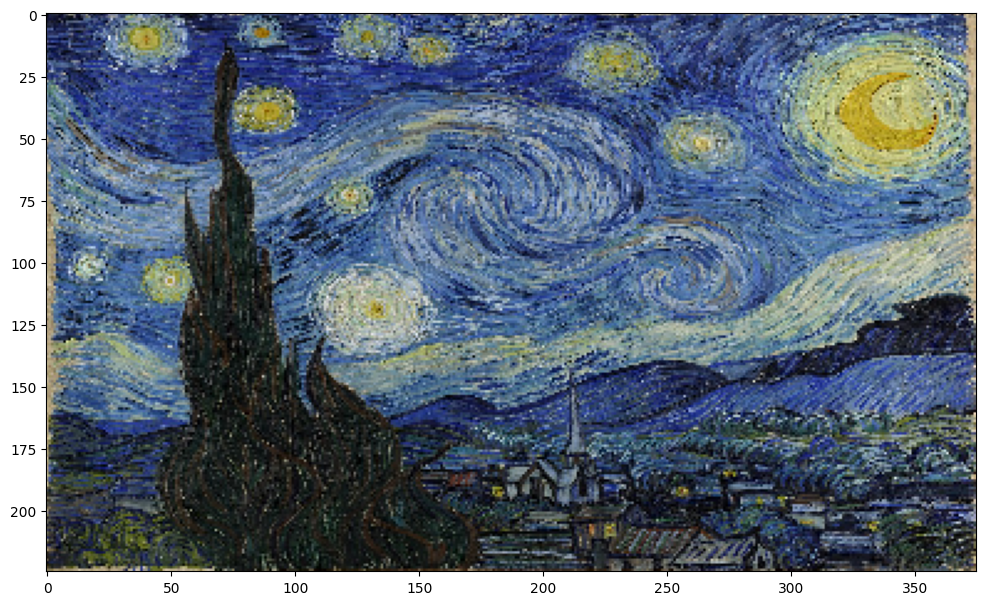

Epoch 0, loss 0.6180766224861145


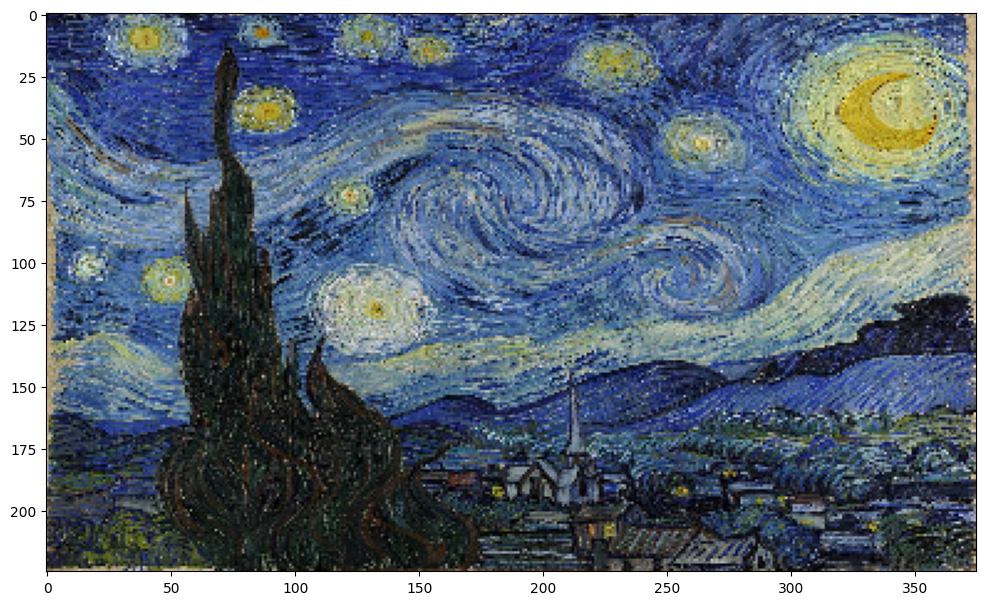

Epoch 200, loss 0.8647146224975586


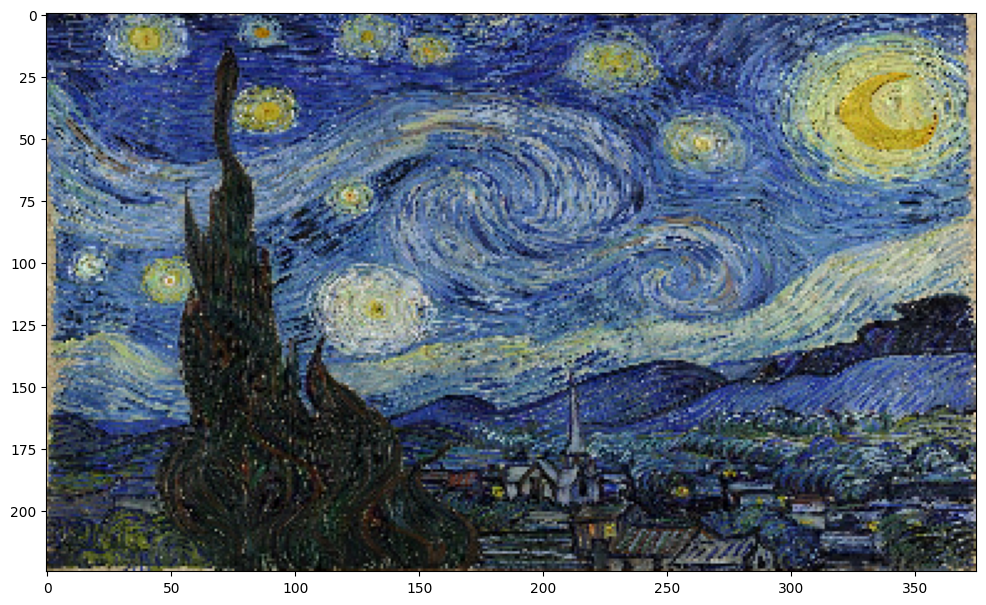

Epoch 400, loss 1.0627137422561646


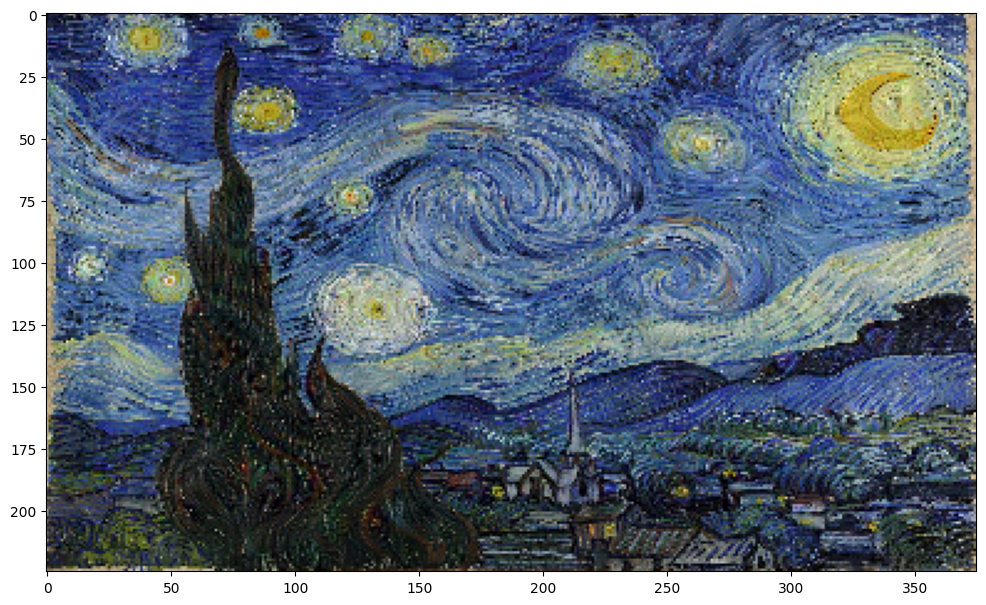

Epoch 600, loss 1.2188866138458252


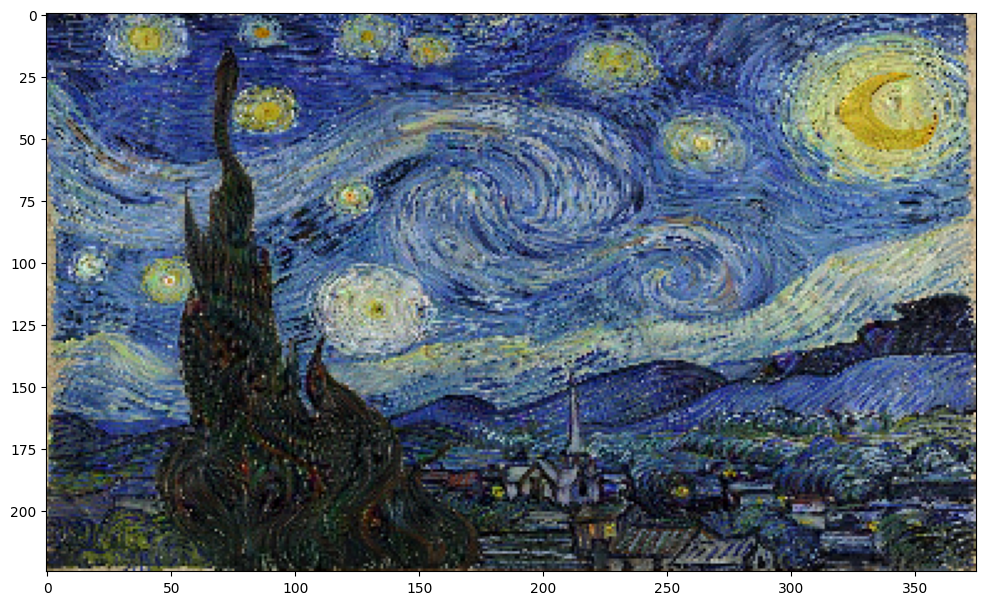

Epoch 800, loss 1.3448121547698975


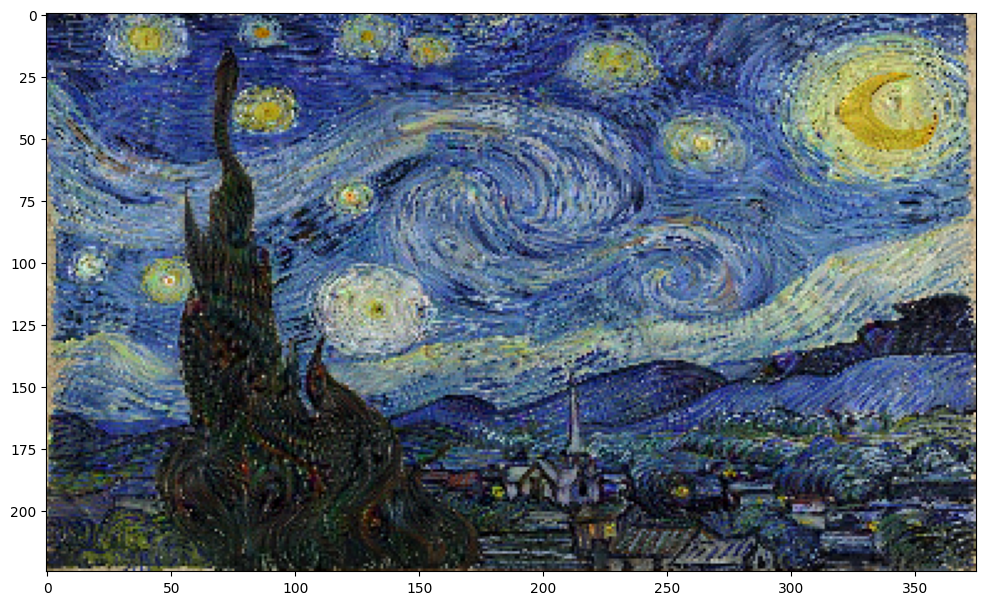

Epoch 1000, loss 1.4461195468902588


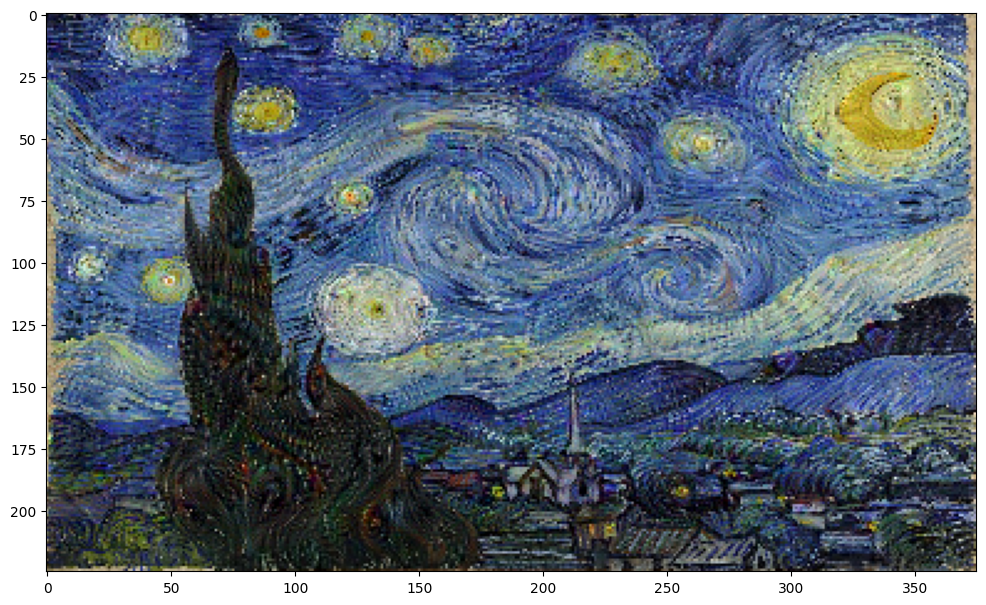

Epoch 1200, loss 1.5313204526901245


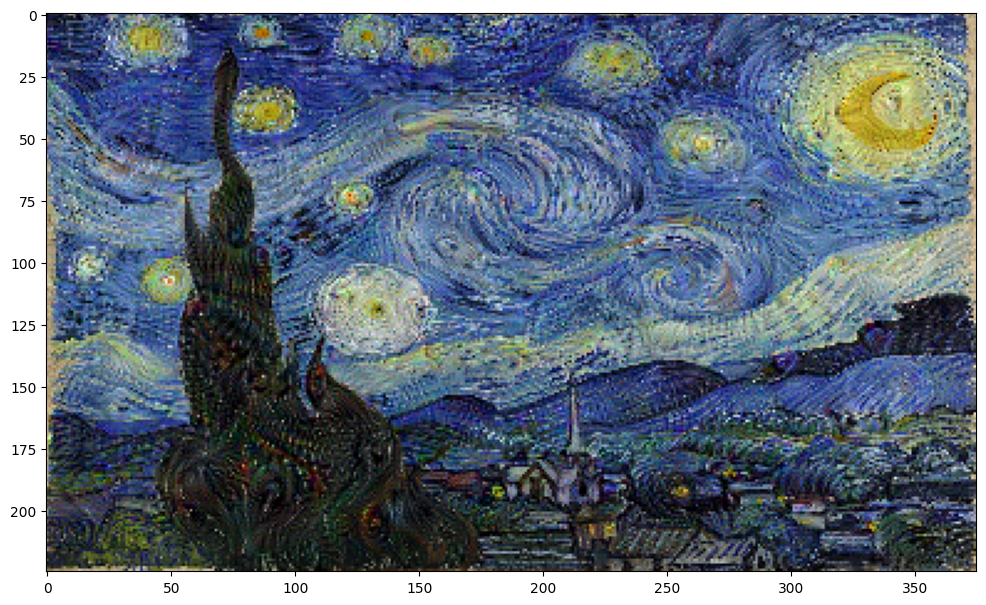

Epoch 1400, loss 1.602661371231079


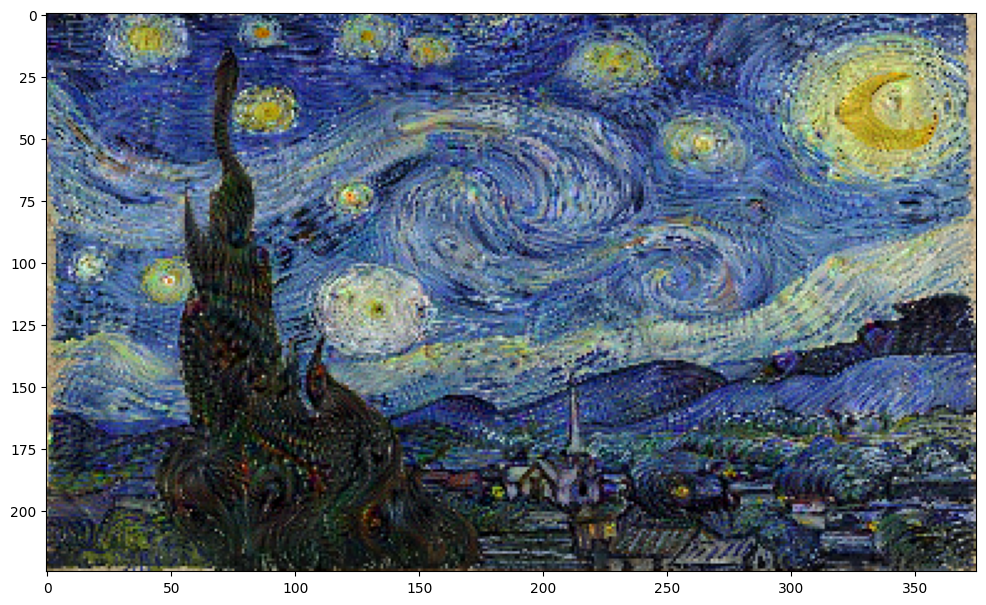

Epoch 1600, loss 1.6658166646957397


KeyboardInterrupt: 

In [40]:
run_deep_dream(network=deep_dream_model, image=image, epochs = 8000, learning_rate=0.0001)